## <font color="#59B4C3">🔨&nbsp;&nbsp;Google Colab Setup</font>
Upload the data (without unzipping them) to your Google Drive to be able to access datasets.

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## <font color="#59B4C3">🎯&nbsp;&nbsp;Your task</font>

In this practical work you will use a Pix2Pix GAN to learn to colorize grayscale images. You won't need to change hyperparameters or the architecture. You can train the model but you won't need to. We provide the weight of a trained model.

The aim of this practical work is to make you understand how we can use this GAN architecture to do colorization, what is the difference with DCGAN and give you ideas about applications of generative models.

### Dataset
To create the dataset, 7192 images have been selected from DIV2K, BSDS300, and UHDSR4K datasets. We didn't take images that were not useful for a colorization task (i.e. grayscale images). All images have been resized to 128x128px. Disclaimer: note that this dataset may contain biases, including but not limited to racial and gender biases.

An important point to consider is that these datasets where not thought for colorization, we can more or less take any color images, take their grayscale version and create a dataset with them.

In [3]:
!unzip /content/drive/MyDrive/pix2pix.zip

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
  inflating: pix2pix/colorization_data/869.jpg  
  inflating: pix2pix/colorization_data/1325.jpg  
  inflating: pix2pix/colorization_data/29.jpg  
  inflating: pix2pix/colorization_data/5143.jpg  
  inflating: pix2pix/colorization_data/3532.jpg  
  inflating: pix2pix/colorization_data/3254.jpg  
  inflating: pix2pix/colorization_data/5625.jpg  
  inflating: pix2pix/colorization_data/1443.jpg  
  inflating: pix2pix/colorization_data/7032.jpg  
  inflating: pix2pix/colorization_data/6338.jpg  
  inflating: pix2pix/colorization_data/1457.jpg  
  inflating: pix2pix/colorization_data/7026.jpg  
  inflating: pix2pix/colorization_data/3240.jpg  
  inflating: pix2pix/colorization_data/5631.jpg  
  inflating: pix2pix/colorization_data/5157.jpg  
  inflating: pix2pix/colorization_data/2638.jpg  
  inflating: pix2pix/colorization_data/3526.jpg  
  inflating: pix2pix/colorization_data/4249.jpg  
  inflating: pix2pix/colo

### Questions 2.1
<pre>
<font color="#74E291">❓ We want to colorize grayscale images. Is there only one valid colorized output?</font>
</pre>

## <font color="#59B4C3">📖&nbsp;&nbsp; Please read the following excerpts from the <a href="https://arxiv.org/pdf/1611.07004.pdf">Pix2Pix</a> paper</font>

The title of the paper is:
> Image-to-Image Translation with Conditional Adversarial Networks

From the abstract:
> We investigate conditional adversarial networks as a general-purpose solution to image-to-image translation problems. These networks not only learn the mapping from input image to output image, but also learn a loss function to train this mapping. This makes it possible to apply the same generic approach to problems that traditionally would require very different loss formulations. We demonstrate that this approach is effective at synthesizing photos from label maps, reconstructing objects from edge maps, and colorizing images, among other tasks

### Questions 2.2
<pre>
<font color="#74E291">❓ Pix2Pix is a Conditional Adversarial Network, in the practical work with DCGAN we were using noise as input.
What is different in the input we have here?

❓ How does our colorization task relates to a problem where we would want to take photos as inputs
and make them look like paintings?
Please provide another task that would be related to these problems.</font>
</pre>

From the introduction:
>CNNs learn to minimize a loss function – an objective that scores the quality of results – and although the learning process is automatic, a lot of manual effort still goes into designing effective losses. In other words, we still have to tell the CNN what we wish it to minimize. But, just like King Midas, we must be careful what we wish for! If we take a naive approach and ask the CNN to minimize the Euclidean distance between predicted and ground truth pixels, it will tend to produce blurry results [<a href="https://arxiv.org/pdf/1604.07379.pdf">43</a>, <a href="https://arxiv.org/pdf/1603.08511.pdf">62</a>]. This is because Euclidean distance is minimized by averaging all plausible outputs, which causes blurring. Coming up with loss functions that force the CNN to do what we really want – e.g., output sharp, realistic images – is an open problem and generally requires expert knowledge.

>It would be highly desirable if we could instead specify only a high-level goal, like “make the output indistinguishable from reality”, and then automatically learn a loss function appropriate for satisfying this goal. Fortunately, this is exactly what is done by the recently proposed Generative Adversarial Networks (GANs)

Please take a look at the figure below from the paper ["Photo-Realistic Single Image Super-Resolution Using a Generative Adversarial Network"](https://arxiv.org/pdf/1609.04802.pdf). It's an illustration of what is talked in the introduction you just read and it should help you answer some of the questions.

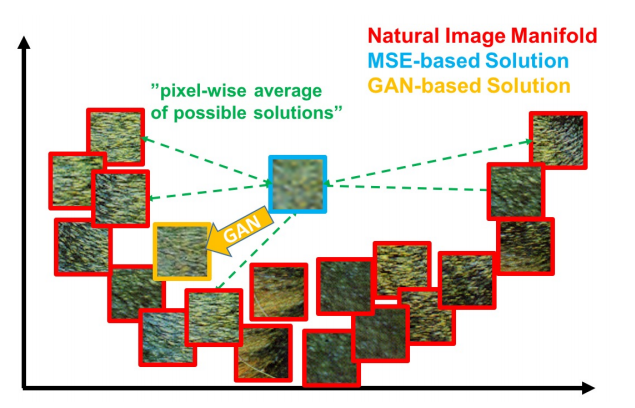

## <font color="#59B4C3">🧐&nbsp;&nbsp;Look at the images below</font>


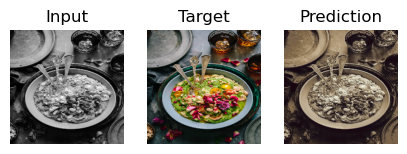

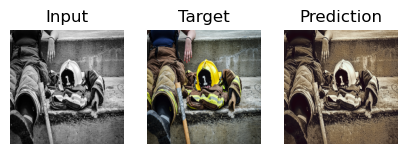

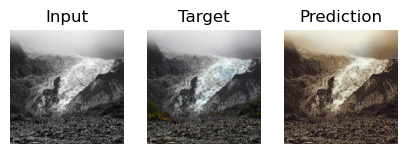

These images are the results of a U-NET model we trained with Adam optimizer and MSE loss function.

### Questions 2.3
<pre>
<font color="#74E291">❓ Why do you think the model predictions look like this?
In which way a Pix2Pix GAN would be useful to improve the results?</font>
</pre>

## <font color="#59B4C3">⚙️&nbsp;&nbsp;Load and preprocess dataset</font>

In [11]:
from skimage import color
import matplotlib.pyplot as plt
import tensorflow as tf

AUTO = tf.data.experimental.AUTOTUNE
IMG_SIZE = 128

def split_input_and_target(img):
    return np.expand_dims(img[:,:,0], axis=-1), img[:,:,1:]

# Rescale between in [-1, 1] range
def rescale_lab_img(img):
    img[:,:,0] = (img[:,:,0] / 50) - 1
    img[:,:,1:] = (img[:,:,1:] + 128) / 127.5 - 1

    return img

def rescale_back_lab_img(img):
    img[:,:,0] = (img[:,:,0] + 1) * 50
    img[:,:,1:] = (img[:,:,1:] + 1) * 127.5 - 128

    return img

def set_shapes(img_size):
    def set_shapes_function(input_img, target_img):
        input_img.set_shape((img_size, img_size, 1))
        target_img.set_shape((img_size, img_size, 2))

        return input_img, target_img

    return set_shapes_function

def preprocess_dataset(ds, img_size):
    ds = ds.map(tf.keras.layers.Rescaling(1./255))
    ds = ds.map(lambda img: tf.numpy_function(color.rgb2lab, [img], tf.float32))
    ds = ds.map(lambda img: tf.numpy_function(rescale_lab_img, [img], tf.float32))
    ds = ds.map(lambda img: tf.numpy_function(split_input_and_target, [img], (tf.float32, tf.float32)))
    ds = ds.map(set_shapes(img_size))
    ds = ds.cache()
    ds = ds.shuffle(256).batch(128).prefetch(AUTO)

    return ds

def create_dataset(img_size, path='./pix2pix/colorization_data/'):
    train_ds = tf.keras.utils.image_dataset_from_directory(
        directory=path,
        label_mode=None,
        color_mode='rgb',
        image_size=(img_size, img_size),
        batch_size=None, # We will create the batches later on
        validation_split=0.05,
        subset="training",
        seed=1234
    )

    val_ds = tf.keras.utils.image_dataset_from_directory(
        directory=path,
        label_mode=None,
        color_mode='rgb',
        image_size=(img_size, img_size),
        batch_size=None, # We will create the batches later on
        validation_split=0.05,
        subset="validation",
        seed=1234
    )

    return (
        preprocess_dataset(train_ds, img_size),
        preprocess_dataset(val_ds, img_size)
    )

train_ds, val_ds = create_dataset(img_size=IMG_SIZE)

Found 7192 files belonging to 1 classes.
Using 6833 files for training.
Found 7192 files belonging to 1 classes.
Using 359 files for validation.


**Note that we are using L\*A\*B\* color space instead of RGB.**

It has three channels:

- L: Luminosity
- A: positives values make the red axis, negatives make the green axis
- B: positives values make the yellow axis, negatives values make the blue axis

<img width="300px" src="https://sensing.konicaminolta.asia/wp-content/uploads/2018/09/3D-LAB.jpg" />

### Questions 2.4

<pre>
<font color="#74E291">❓ What is the advantage to use L*A*B* color space instead of RGB in our case?</font>
</pre>


## <font color="#59B4C3">🌆&nbsp;&nbsp; Visualize dataset</font>

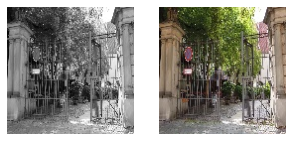

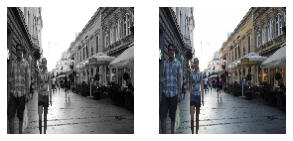

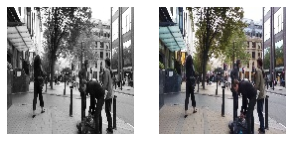

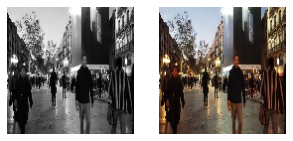

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

for grayscales, images in train_ds.take(1):
    for i in range(4):
        _, axs = plt.subplots(1, 2, figsize=(5, 10))

        grayscale = grayscales[i].numpy()
        axs[0].imshow(np.squeeze(grayscale), cmap="gray")
        axs[0].axis("off")

        target_img = np.concatenate([grayscale, images[i].numpy()], axis=-1)
        target_img = rescale_back_lab_img(target_img)
        target_img = color.lab2rgb(target_img)

        axs[1].imshow(target_img)
        axs[1].axis("off")

        plt.show()

## <font color="#59B4C3">🧑‍🎨&nbsp;&nbsp;Create generator (U-NET)</font>

In [ ]:
import tensorflow as tf
from tensorflow import pad
from tensorflow.keras.layers import Layer
from tensorflow.keras import layers
from tensorflow import keras

In [ ]:
from keras.initializers import RandomNormal

INITIALIZER = RandomNormal(stddev=0.01)

# Define a group of layers used for convolution
def conv(x, filters, kernel_size=4, strides=1, kernel_initializer=INITIALIZER, activation="leaky_relu", batchnorm=True):
    fx = layers.Conv2D(filters, kernel_size=kernel_size, strides=strides, padding="same", kernel_initializer=kernel_initializer)(x)

    if batchnorm:
      fx = layers.BatchNormalization()(fx)

    if activation == "leaky_relu":
      fx = tf.keras.layers.LeakyReLU(alpha=0.2)(fx)
    else:
      fx = tf.keras.layers.ReLU()(fx)

    return fx

# Layers reducing images size
def downsample(x, filters, kernel_size=4):
    fx = conv(x, filters=filters, kernel_size=kernel_size)
    fx = conv(x, filters=filters, kernel_size=kernel_size)
    downsampled = conv(fx, filters=filters, kernel_size=kernel_size, strides=2)

    return fx, downsampled

# Layers increasing images size
def upsample(residual_link, x, filters, kernel_size=4):
    fx = layers.UpSampling2D(size=2)(x)
    fx = layers.Concatenate(axis=-1)([residual_link, fx])

    fx = conv(fx, filters=filters, kernel_size=kernel_size)
    fx = conv(fx, filters=filters, kernel_size=kernel_size)

    return fx

In [ ]:
# Function to create a U-NET model
def unet_model(init_filters=16, output_channels=2, n_downsampling=4):
    inputs = tf.keras.layers.Input(shape=(None, None, 1))

    fx = inputs
    residual_links = []

    # Downsampling
    for d in range(n_downsampling):
        residual_link, fx = downsample(fx, filters=init_filters * (2 ** d))
        residual_links.append(residual_link)

    # Middle
    fx = conv(fx, filters=init_filters * (2 ** n_downsampling))
    fx = conv(fx, filters=init_filters * (2 ** n_downsampling))

    # Upsample
    for u in range(n_downsampling):
        fx = upsample(residual_links[-(u + 1)], fx, init_filters * (2 ** (n_downsampling - u - 1)))

    # Final layer
    last = layers.Conv2D(
        filters=output_channels,
        kernel_size=5,
        padding="same",
        kernel_initializer=INITIALIZER,
        activation="tanh",
    )(fx)

    return tf.keras.Model(inputs=inputs, outputs=last)

In [ ]:
generator = unet_model()
generator.summary()

/usr/local/lib/python3.8/dist-packages/keras/initializers/initializers_v2.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values  each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv2d_1 (Conv2D)              (None, None, None,   272         ['input_1[0][0]']                
                                16)                                                               
                                                                                                  
 batch_normalization_1 (BatchNo  (None, None, None,   64         ['conv2d_1[0][0]']               
 rmalization)                   16)                                                           

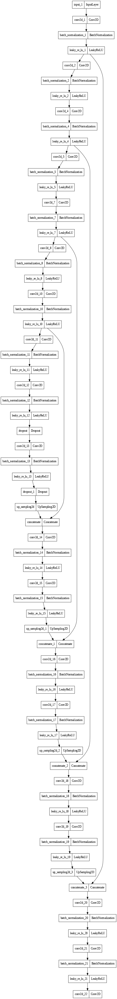

In [ ]:
tf.keras.utils.plot_model(generator, dpi=60)

### Questions 2.5

<pre>
<font color="#74E291">❓ What does it mean to have an input shape of (None, None, 1)?

❓ Look at the architecture plot.
What are the connections between some layers of the downsampling and upsampling parts?

❓ Why do we have only two outputs channels? What is the model output?</font>
</pre>

## <font color="#59B4C3">🕵️&nbsp;&nbsp;Create discriminator (PatchGAN)</font>

#### From the Pix2Pix paper:

> "\[...\] we design a discriminator architecture – which we term a PatchGAN – that only penalizes structure at the scale of patches. This discriminator tries to classify if each N × N patch in an image is real or fake. We run this discriminator convolutionally across the image, averaging all responses to provide the ultimate output of D*."

\*the discriminator

In [ ]:
N_DISCR_DOWNSAMPLE = 5
DISCR_OUTPUT_SHAPE = (IMG_SIZE // (2 ** N_DISCR_DOWNSAMPLE), IMG_SIZE // (2 ** N_DISCR_DOWNSAMPLE), 2)

def patchgan_model(init_filters=4):
    inp = tf.keras.layers.Input(shape=[None, None, 1], name='input_image')
    tar = tf.keras.layers.Input(shape=[None, None, 2], name='target_image')

    merged = layers.Concatenate()([inp, tar])
    previous_layer = merged

    for i in np.arange(N_DISCR_DOWNSAMPLE):
        fx = conv(previous_layer, filters=init_filters * 2 ** (i + 1), kernel_size=4, strides=2, batchnorm=(i != 0))
        previous_layer = fx

    fx = conv(previous_layer, filters=init_filters * 2 ** (N_DISCR_DOWNSAMPLE + 1), kernel_size=4)
    fx = layers.Dropout(0.5)(fx)

    # patch output
    last = layers.Conv2D(filters=2, kernel_size=3, padding="same", kernel_initializer=INITIALIZER)(fx)

    return tf.keras.Model([inp, tar], last)

In [ ]:
discriminator = patchgan_model()
discriminator.compile(
    loss='binary_crossentropy',
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5, beta_2=0.9),
    loss_weights=[0.5]
)

discriminator.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_image (InputLayer)       [(None, None, None,  0           []                               
                                 1)]                                                              
                                                                                                  
 target_image (InputLayer)      [(None, None, None,  0           []                               
                                 2)]                                                              
                                                                                                  
 concatenate_4 (Concatenate)    (None, None, None,   0           ['input_image[0][0]',            
                                3)                                'target_image[0][0]']     

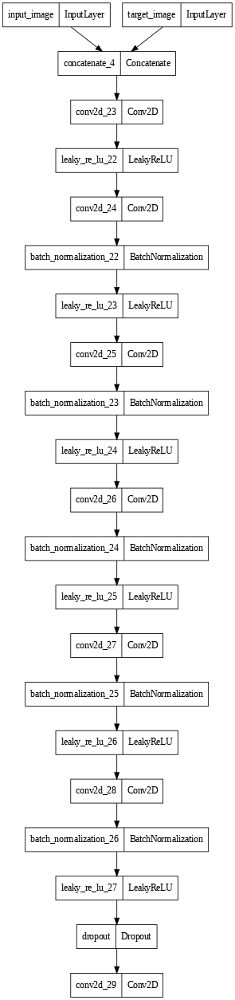

In [ ]:
tf.keras.utils.plot_model(discriminator, dpi=60)

## <font color="#59B4C3">🚀&nbsp;&nbsp;Training Pix2Pix</font>

In [ ]:
from tensorflow.keras import Model

# define the combined generator and discriminator model, for updating the generator
def combined_gan_model(generator, disc):
    # make weights in the discriminator not trainable
    for layer in disc.layers:
        if not isinstance(layer, layers.BatchNormalization):
            layer.trainable = False

    # define the source image
    gen_in = layers.Input(shape=[None, None, 1])
    gen_out = generator(gen_in)

    # connect the source input and generator output to the discriminator input
    disc_out = disc([gen_in, gen_out])

    # src image as input, generated image and classification output
    combined_model = Model(gen_in, [disc_out, gen_out])

    # compile model
    combined_model.compile(
        loss=['binary_crossentropy', 'mae'],
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5, beta_2=0.9),
        loss_weights=[1,100]
    )

    return combined_model

In [ ]:
gan = combined_gan_model(generator, discriminator)
gan.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, None, None,  0           []                               
                                 1)]                                                              
                                                                                                  
 model (Functional)             (None, None, None,   3494114     ['input_2[0][0]']                
                                2)                                                                
                                                                                                  
 model_1 (Functional)           (None, None, None,   705850      ['input_2[0][0]',                
                                2)                                'model[0][0]']            

In [ ]:
import matplotlib.pyplot as plt
def generate_images(generator_model, input_images, target_images):
    pred_images = generator_model(input_images, training=True)

    for i in np.arange(len(input_images)):
        _, axs = plt.subplots(1, 3, figsize=(8, 12))

        input_img = input_images[i].numpy()
        axs[0].imshow(np.squeeze(input_img), cmap="gray")
        axs[0].set_title("Input")
        axs[0].axis("off")

        target_img = np.concatenate([input_img, target_images[i].numpy()], axis=-1)
        target_img = rescale_back_lab_img(target_img)
        target_img = color.lab2rgb(target_img)
        axs[1].imshow(target_img)
        axs[1].set_title("Target")
        axs[1].axis("off")

        pred_img = np.concatenate([input_img, pred_images[i].numpy()], axis=-1)
        pred_img = rescale_back_lab_img(pred_img)
        pred_img = color.lab2rgb(pred_img)
        axs[2].imshow(pred_img)
        axs[2].set_title("Prediction")
        axs[2].axis("off")

        plt.show()

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 14 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


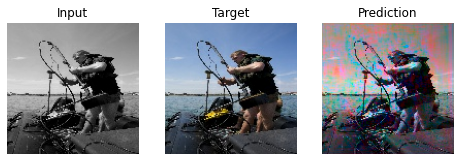

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 1 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


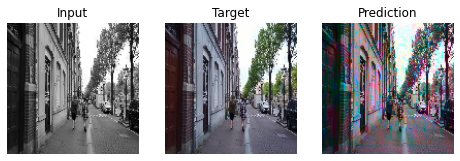

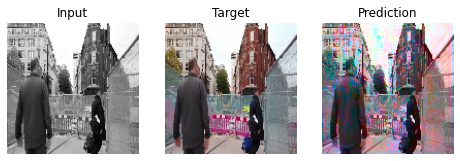

In [ ]:
for example_input, example_target in val_ds.take(1):
    generate_images(generator, example_input[:3], example_target[:3])

In [ ]:
# train pix2pix models
def train(d_model, g_model, gan_model, train_ds, val_ds, n_steps):
    d_loss_history = []
    g_loss_history = []

    for step, (input_images, target_images) in train_ds.repeat().take(n_steps).enumerate():
        # Get generated samples
        gen_output = g_model(input_images, training=True)

        # Get output of discriminator for both real and generated samples
        disc_real_output = d_model([input_images, target_images], training=True)
        disc_generated_output = d_model([input_images, gen_output], training=True)

        real_sample_labels = tf.fill((input_images.shape[0], DISCR_OUTPUT_SHAPE[0], DISCR_OUTPUT_SHAPE[1], DISCR_OUTPUT_SHAPE[2]), 0.9)
        fake_sample_labels = tf.fill((input_images.shape[0], DISCR_OUTPUT_SHAPE[0], DISCR_OUTPUT_SHAPE[1], DISCR_OUTPUT_SHAPE[2]), 0.)

        # Update discriminator for real samples
        d_loss1 = d_model.train_on_batch([input_images, target_images], real_sample_labels)

        # Update discriminator for generated samples
        d_loss2 = d_model.train_on_batch([input_images, gen_output], fake_sample_labels)

        d_loss = d_loss1 + d_loss2

        # Update the generator
        g_loss, _, _ = gan_model.train_on_batch(input_images, [real_sample_labels, target_images])

        if (step + 1) % 100 == 0:
            print('>%d, d[%.3f] g[%.3f]' % (step+1, d_loss, g_loss))

            # Add losses to history
            d_loss_history.append(d_loss)
            g_loss_history.append(g_loss)

            for example_input, example_target in val_ds.take(1):
                generate_images(generator, example_input[:3], example_target[:3])

    return d_loss_history, g_loss_history

>100, d[1.125] g[7.797]


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 57 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


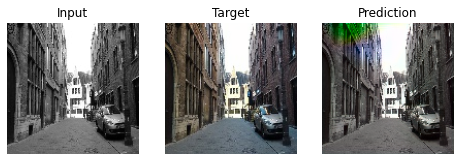

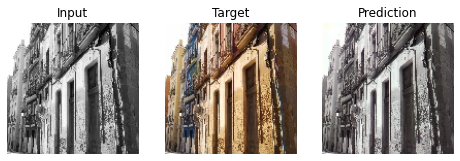

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 25 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


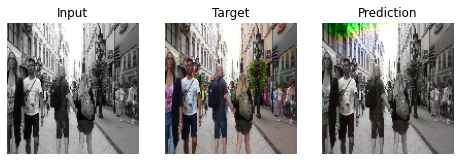

>200, d[0.985] g[6.816]


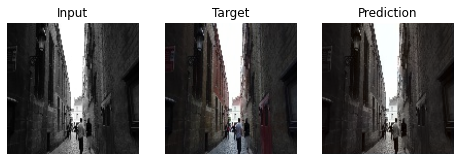

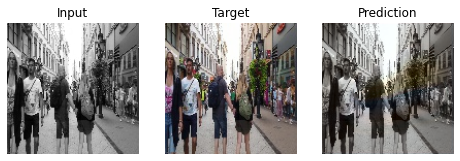

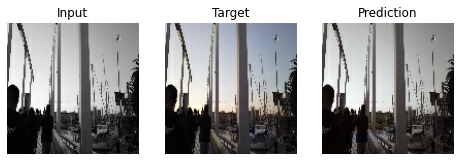

>300, d[0.719] g[7.012]


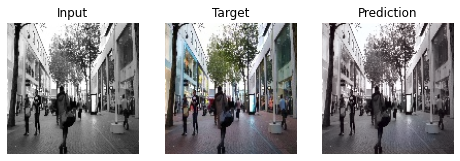

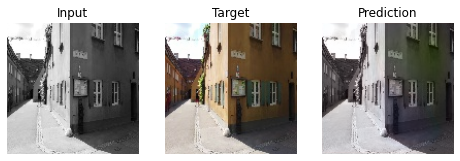

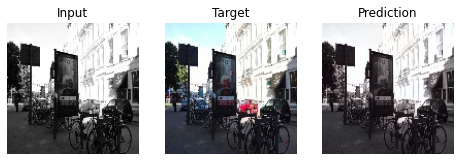

>400, d[1.054] g[5.310]


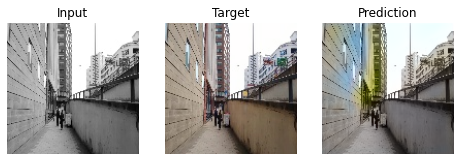

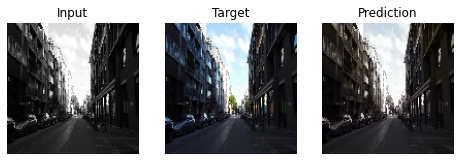

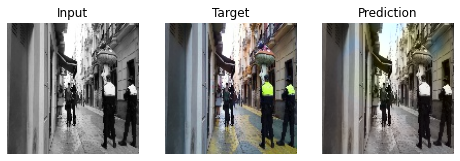

>500, d[0.940] g[6.437]


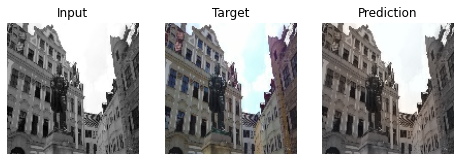

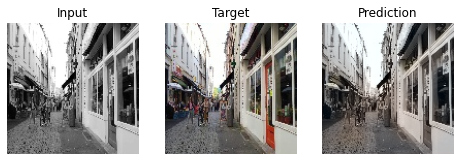

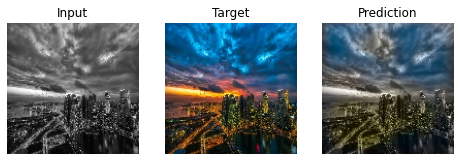

>600, d[0.959] g[6.078]


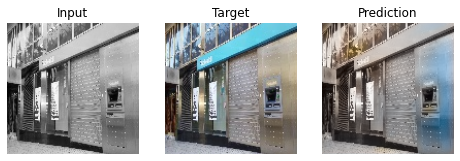

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 28 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


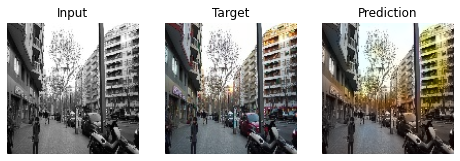

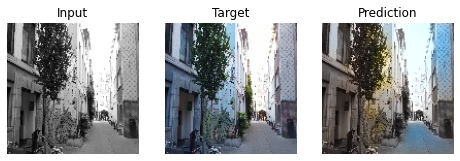

>700, d[0.666] g[6.500]


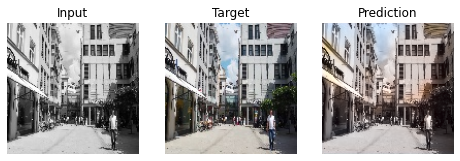

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 9 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


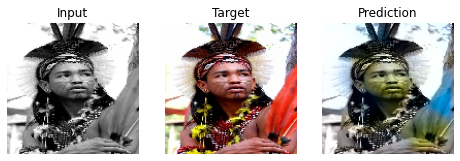

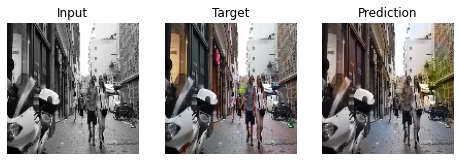

>800, d[0.952] g[6.242]


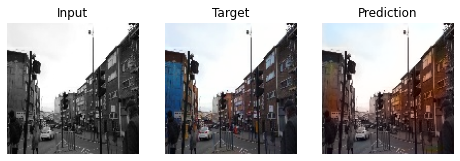

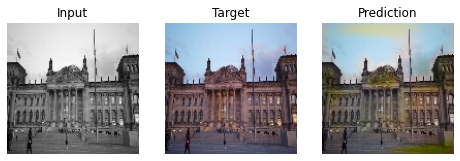

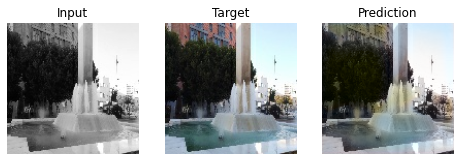

>900, d[0.655] g[6.149]


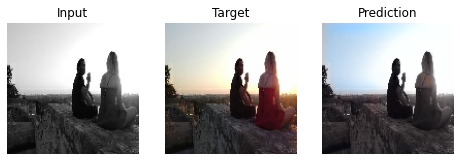

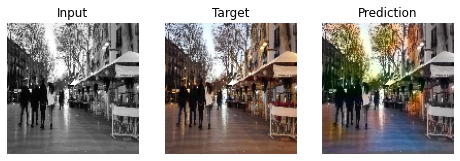

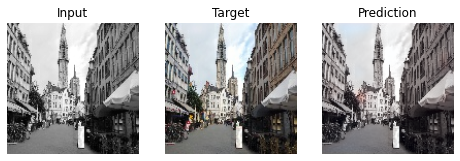

>1000, d[0.796] g[6.169]


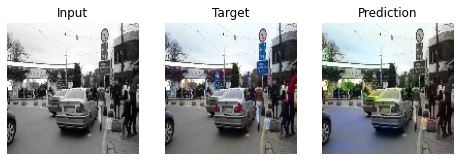

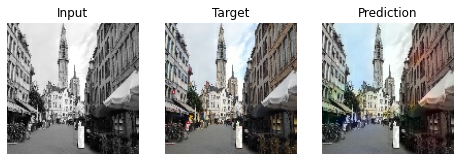

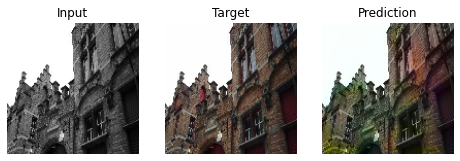

>1100, d[0.803] g[6.527]


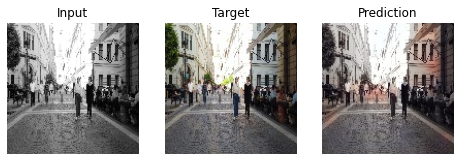

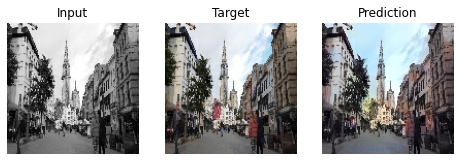

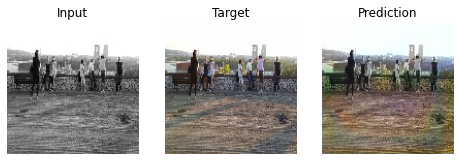

>1200, d[0.650] g[5.932]


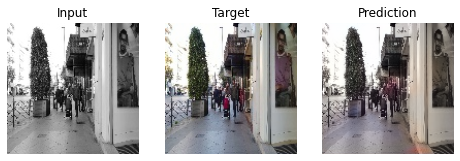

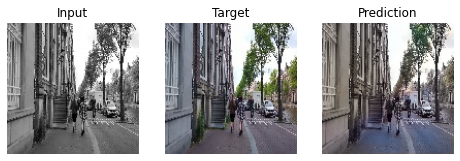

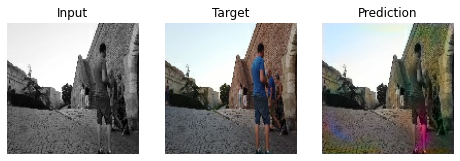

>1300, d[0.903] g[5.993]


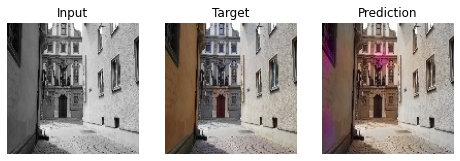

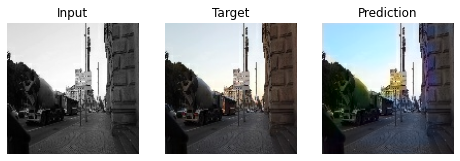

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 4 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


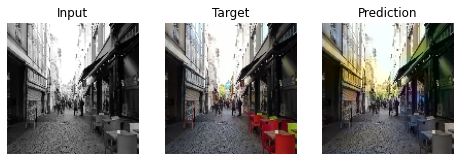

>1400, d[0.842] g[7.941]


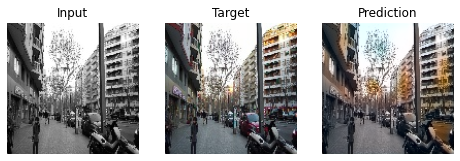

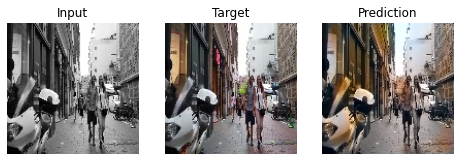

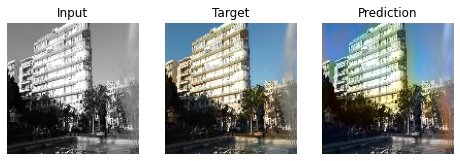

>1500, d[0.892] g[6.776]


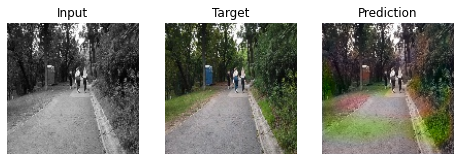

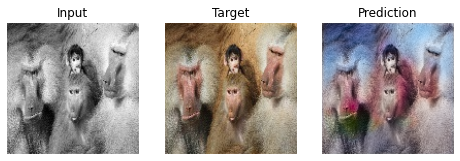

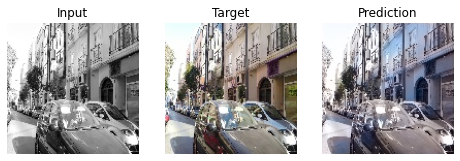

>1600, d[0.881] g[6.150]


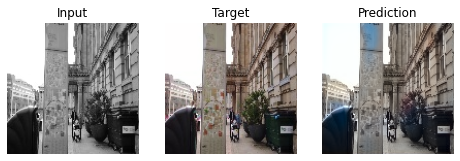

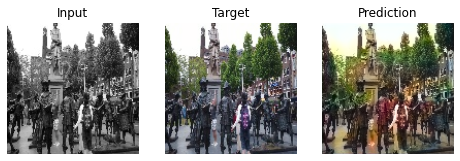

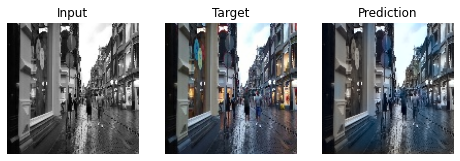

>1700, d[0.734] g[6.323]


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 2 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


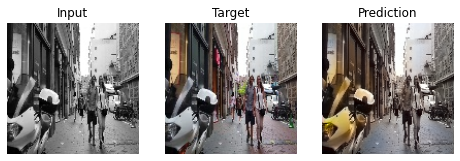

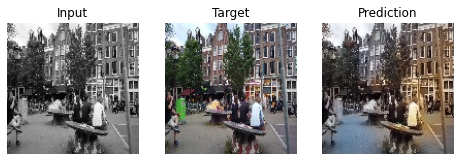

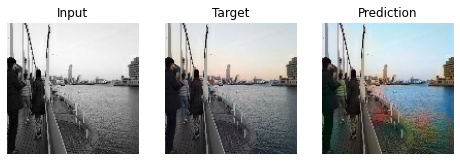

>1800, d[0.648] g[6.162]


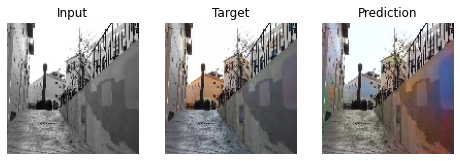

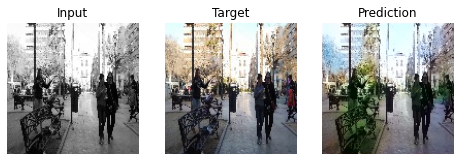

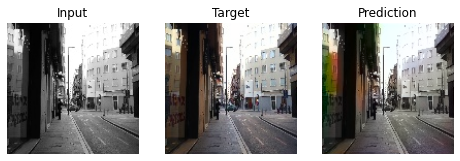

>1900, d[0.917] g[6.550]


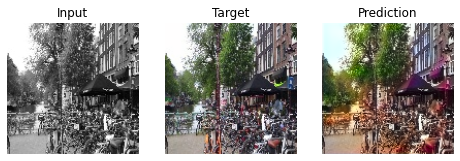

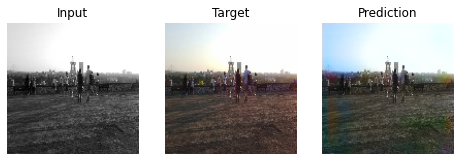

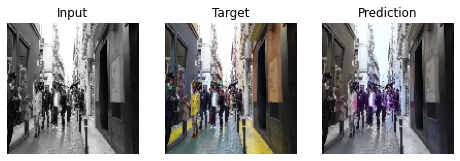

>2000, d[0.721] g[6.316]


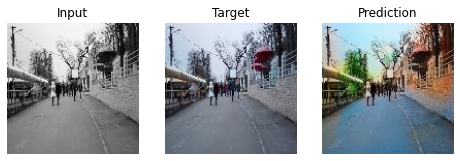

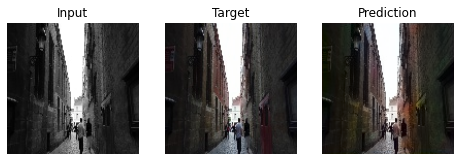

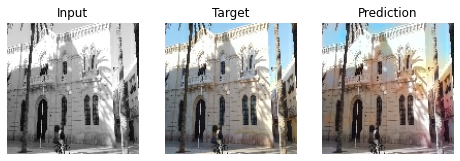

>2100, d[0.747] g[6.089]


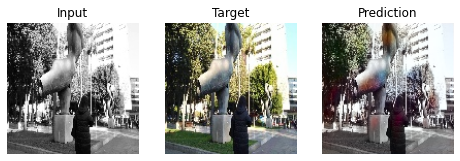

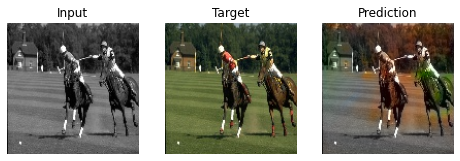

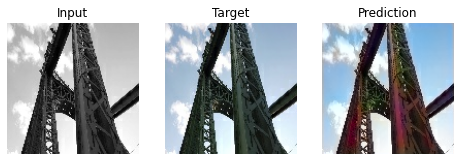

>2200, d[0.830] g[6.402]


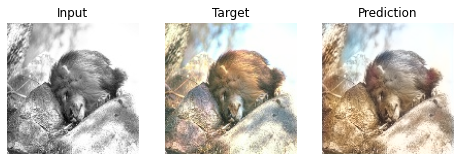

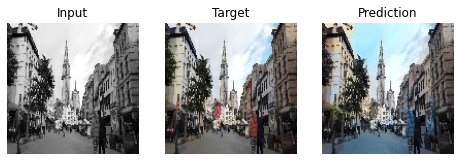

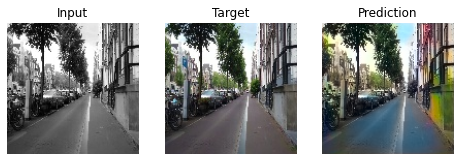

>2300, d[0.659] g[6.054]


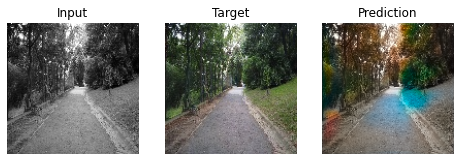

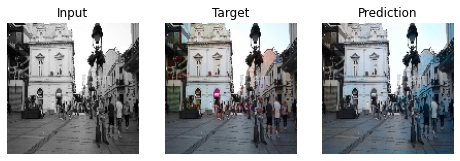

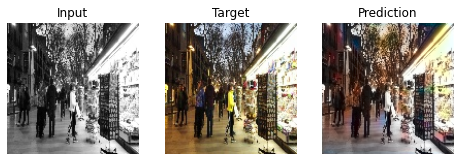

>2400, d[0.713] g[5.680]


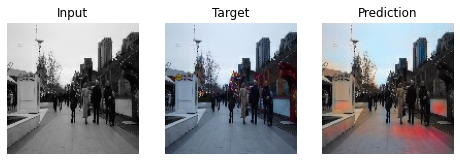

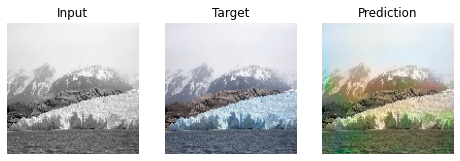

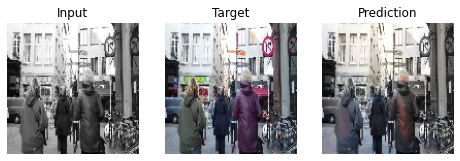

>2500, d[0.783] g[6.359]


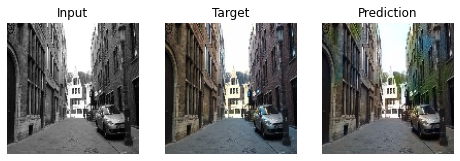

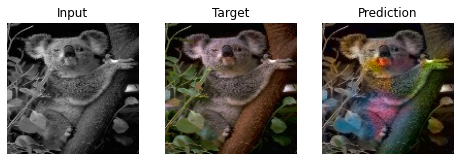

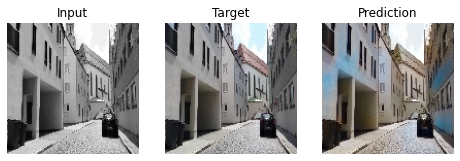

>2600, d[0.739] g[5.777]


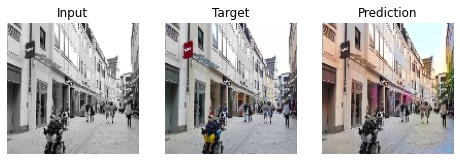

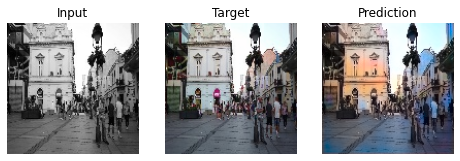

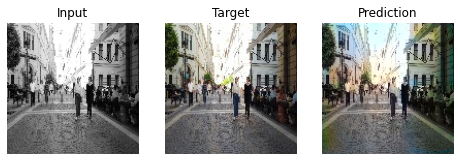

>2700, d[0.720] g[5.819]


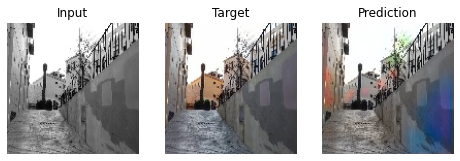

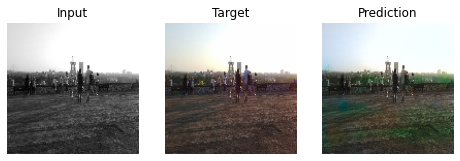

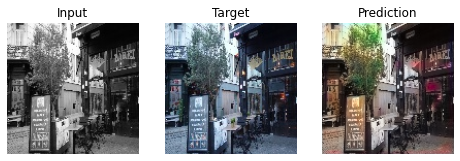

>2800, d[0.595] g[5.705]


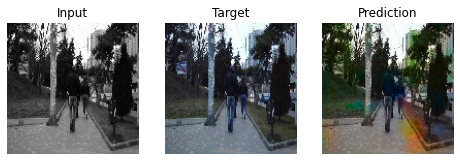

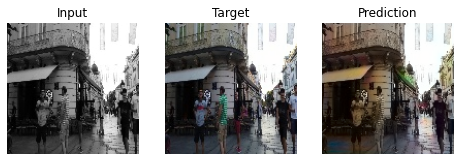

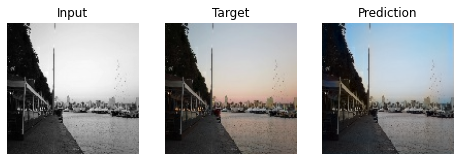

>2900, d[0.819] g[6.030]


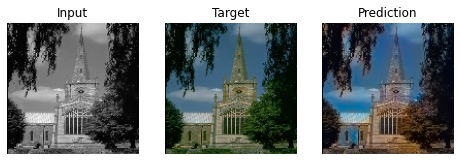

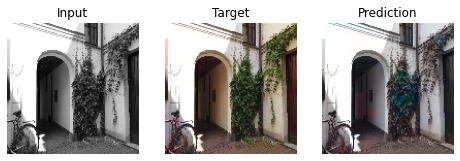

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 5 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


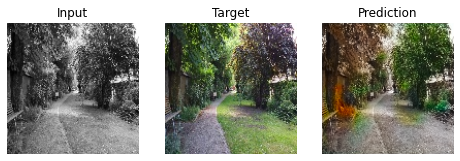

>3000, d[0.668] g[5.688]


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 34 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


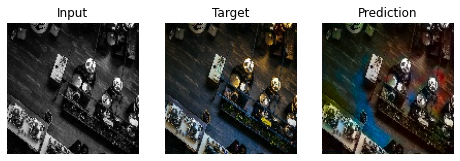

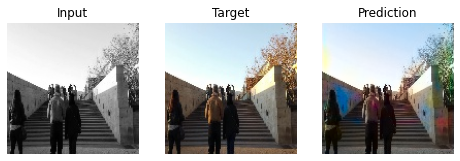

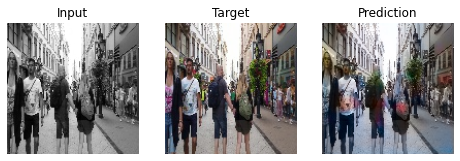

>3100, d[0.639] g[5.982]


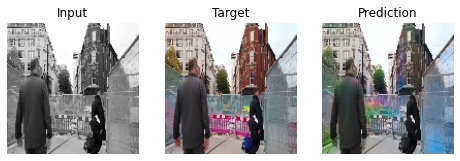

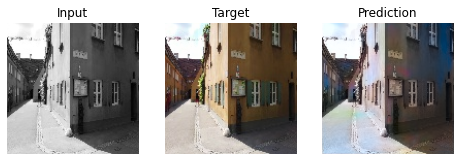

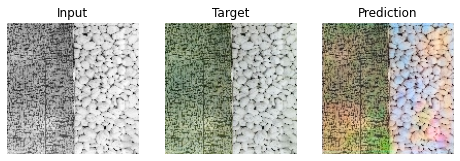

>3200, d[0.719] g[5.632]


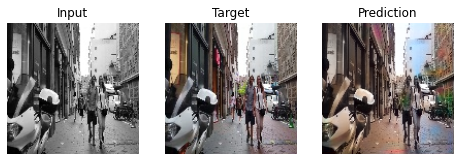

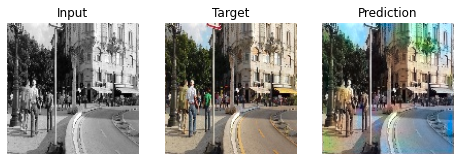

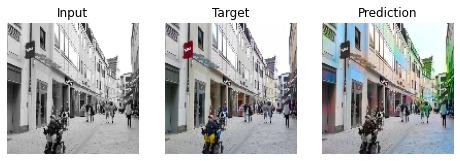

>3300, d[0.901] g[5.869]


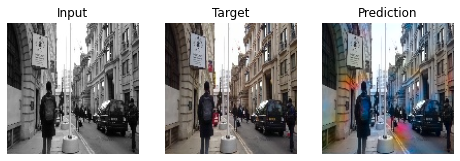

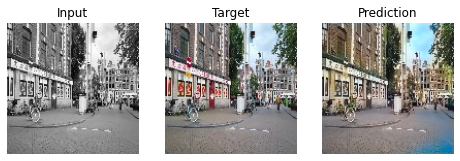

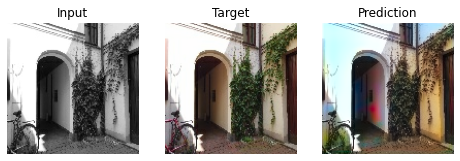

>3400, d[0.591] g[5.860]


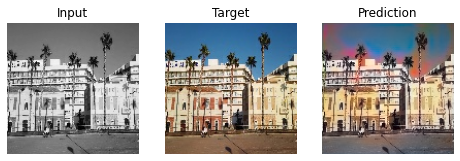

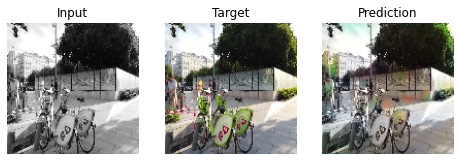

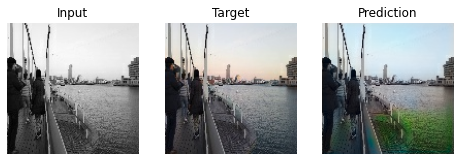

>3500, d[0.635] g[5.988]


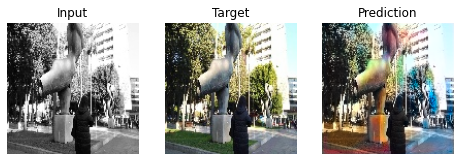

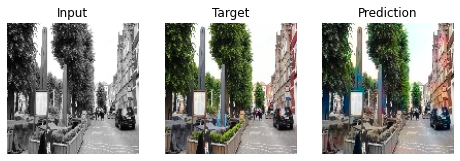

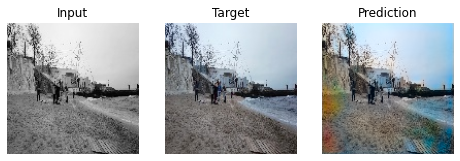

In [ ]:
N_STEP = 3_500
d_loss_history, g_loss_history = train(discriminator, generator, gan, train_ds, val_ds, N_STEP)

## <font color="#59B4C3">🎨&nbsp;&nbsp;Colorize An Image</font>

In [4]:
from tensorflow import keras

generator = keras.models.load_model('pix2pix/generator')

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


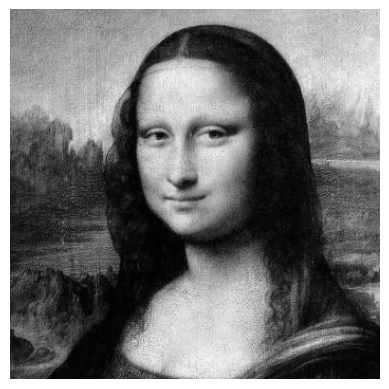

In [20]:
import cv2
import matplotlib.pyplot as plt

# TODO: Change the path to your image
img = cv2.imread('/content/drive/MyDrive/MonaLisa.jpg', cv2.IMREAD_GRAYSCALE)

plt.axis('off')
plt.imshow(img, cmap="gray")

In [21]:
# TODO: Preprocess image (don't forget the preprocesses we use to train the model)

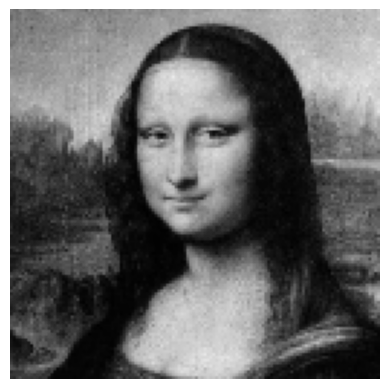

In [22]:
plt.axis('off')
plt.imshow(img, cmap="gray", vmin=-1, vmax=1)

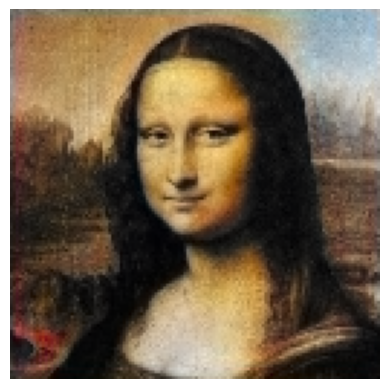

In [23]:
# TODO: Colorize image and construct back the image to RGB (see how we do it when displaying generated images)

plt.axis('off')
plt.imshow(pred_img)

## Questions 2.6

<pre>
<font color="#74E291">❓ In the training process, do the discriminator compare pairs of target and predicted images?

❓ Let's consider that the generator model is better than the one trained here.
Is it probable for the generator to produce an image that is the same as one from the targets set
(with the real colors)? Why so?

❓ Look at the training code, what is the value we expect the discriminator to give us when the image is
fake and the one when the image is real.

❓ Provide three colorized images with the model that you find interesting
(e.g. well colorized, artistic, disastrous result, ...).

❓ Provide an image you have in grayscale (convert one in graycale if you don't have any)
and apply the model on your image.
</pre>